# End-to-end Multiclass Dog Breed Classification Using TensorFlow

## 1. Problem Statement

Identify the breed of a dog given an image.

## 2. Data

Data is from Kaggle's dog breed identification competition.
> https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

Per Kaggle:
> `Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.`

Evaluation should be a file with a header and a probability prediction for each dog breed image in Test.

## 4. Features

* Data is unstructured (images)
* There are 120 different dog breeds represented
* There are 10,000+ images in both Train and Test. Train is labeled.

In [1]:
# Unzip the data in Drive
# !unzip 'drive/My Drive/Dog Vision/dog-breed-identification.zip' -d 'drive/My Drive/Dog Vision/'

### Get workspace ready

* Import TensorFlow
* Imoprt Tensorflow Hub
* Make sure we're using a GPU

In [2]:
# Imports
import os
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from IPython.display import Image
from sklearn.model_selection import train_test_split

import tensorflow as tf
import tensorflow_hub as hub
print('TF version: ', tf.__version__)
print('TF hub version: ', hub.__version__)

# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version:  2.17.0
TF hub version:  0.16.1
GPU available


## Getting our data ready

Turning images into numerical representations (Tensors)

In [3]:
labels_csv = pd.read_csv('drive/My Drive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


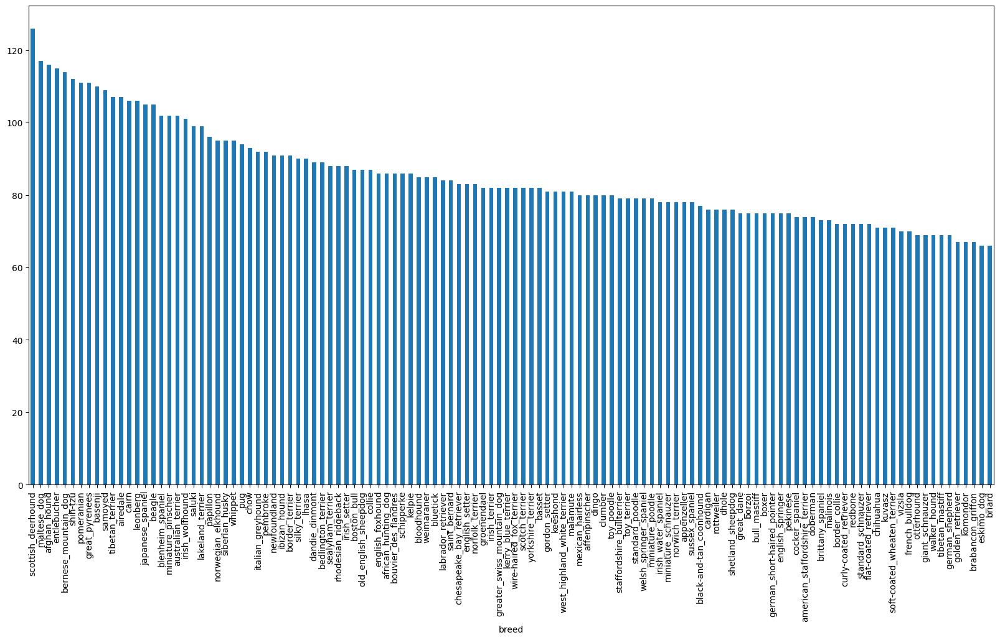

In [4]:
# How many images for each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [5]:
labels_csv['breed'].value_counts().median()

82.0

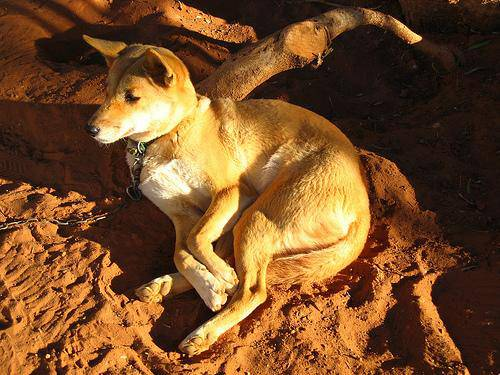

In [6]:
# View an image
Image('drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Get a list of all image filepath names

In [7]:
# Create pathnames from iamge ID's
filenames = ['drive/My Drive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check number of filenames matches number of actual image files
if len(filenames) == len(os.listdir('drive/My Drive/Dog Vision/train/')):
  print('Filenames match amount of files')
else:
  print('Filename number and actual file number mismatch, check target directory')

Filenames match amount of files


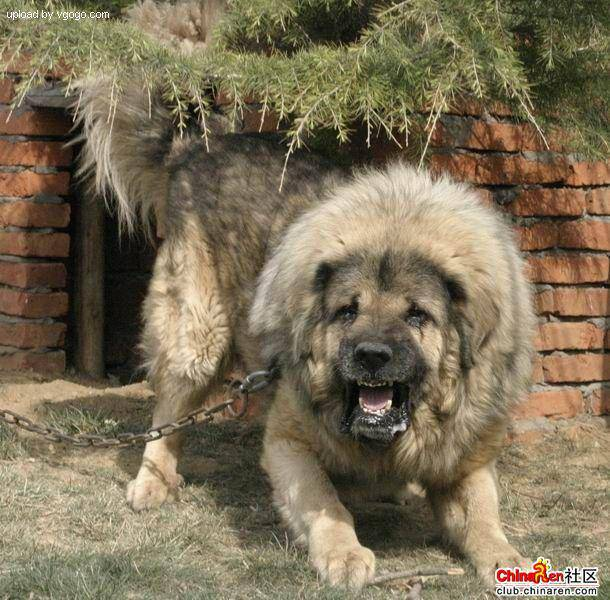

In [9]:
Image(filenames[9000])

In [10]:
labels_csv['breed'][9000]

'tibetan_mastiff'

### Prepare labels

In [11]:
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
if len(labels) == len(filenames):
  print('Labels matches filenames')
else:
  print('Label and filename mismatch.')

Labels matches filenames


In [13]:
# Fine the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [14]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Validation Set

In [18]:
X = filenames
y = boolean_labels

In [19]:
# Create a subset for faster experimentation
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [20]:
# Split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [21]:
X_train[0], y_train[0]

('drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
    

## Preprocessing Images (turning images into Tensors)

In [22]:
# Convert image to NP array
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
# Turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [24]:
# Define image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Preprocess images into Tensors
  1. Take an image filepath as input
  2. Use TensorFlow to read the file and save it to a variable `image`
  3. Turn `image` into Tensors
  4. Resize the `image` to be of shape IMG_SIZE
  5. Return the modified `image`
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

### Turn data into batches

In [25]:
def get_image_label(image_path, label):
  """
  Takes an image filepath name and the associated label, processes the image, and returns tuple (image, label)
  """
  image = process_image(image_path)
  return image, label

In [26]:
(get_image_label(X[42], y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [27]:
# Define the batch size
BATCH_SIZE = 32

def create_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if train but not if validation.
  Accepts test data as input with no labels.
  """
  # Test data
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # Validation data
  elif valid_data:
    print('Creating Validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  # Training data
  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling before mapping
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [28]:
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating Validation data batches...


In [29]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [30]:
def show_images(images, labels, n=25):
  """
  Display a plot of n images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  for i in range(n):
    # Create subplots
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [31]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[2.74859965e-01, 2.90546238e-01, 2.00350165e-01],
          [2.99222291e-01, 3.14908564e-01, 2.24712476e-01],
          [2.73598969e-01, 2.89285243e-01, 1.99089184e-01],
          ...,
          [3.81031185e-01, 4.20246869e-01, 3.88874322e-01],
          [3.63191456e-01, 4.12036121e-01, 3.95754576e-01],
          [3.56538862e-01, 4.15362418e-01, 3.95754576e-01]],
 
         [[2.23689020e-01, 2.38403663e-01, 1.50150850e-01],
          [2.60057777e-01, 2.74772406e-01, 1.86519623e-01],
          [2.61151969e-01, 2.75866628e-01, 1.87613815e-01],
          ...,
          [3.86494070e-01, 4.25709754e-01, 3.94337207e-01],
          [3.58622134e-01, 4.07466799e-01, 3.91185254e-01],
          [3.51969540e-01, 4.10793096e-01, 3.91185254e-01]],
 
         [[2.01645911e-01, 2.13410616e-01, 1.31057665e-01],
          [2.26148844e-01, 2.37913549e-01, 1.55560598e-01],
          [2.30367094e-01, 2.42131799e-01, 1.59778848e-01],
          ...,
          [3.92287016e-01, 4.31502700e-01, 4.0013

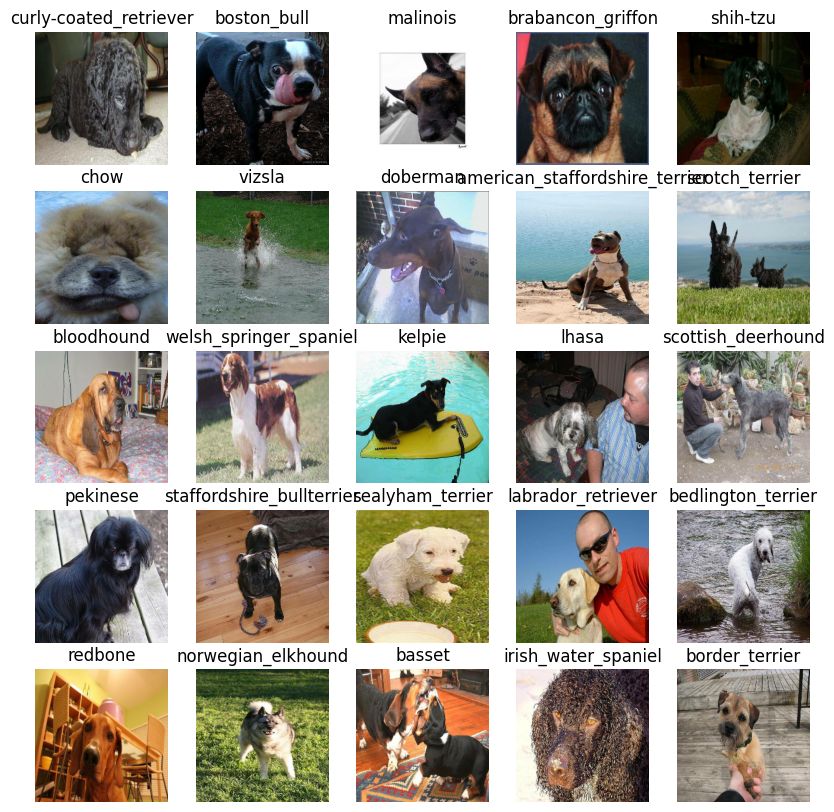

In [32]:
show_images(train_images, train_labels)

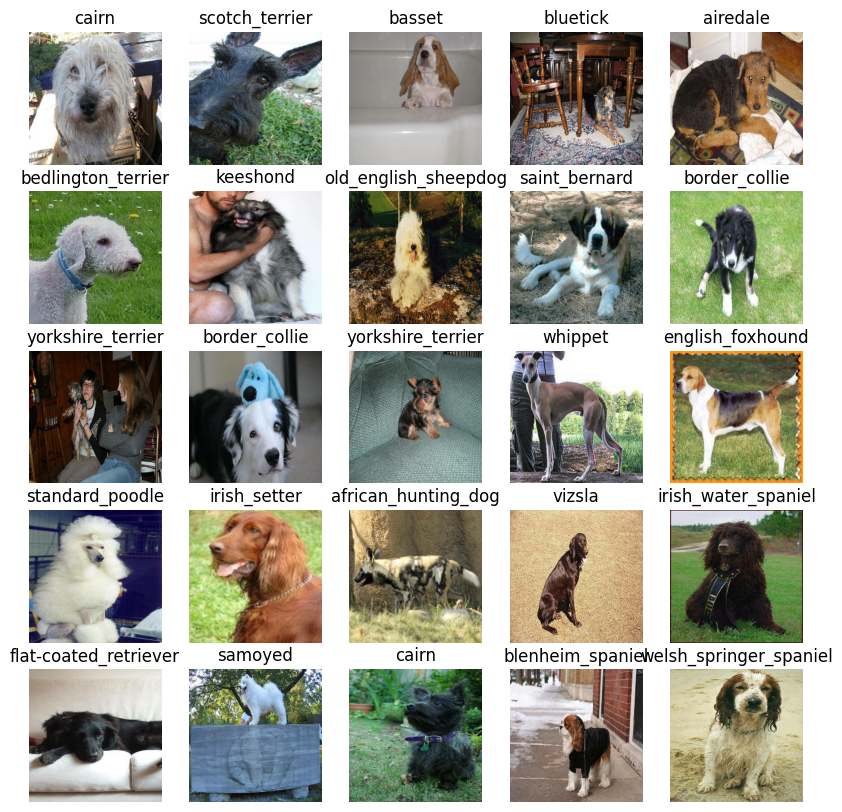

In [33]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_images(val_images, val_labels)

## Building a model

* Define input shape
* Define output shape
* Model URL

In [34]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Hub
MODEL_URL = 'https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1'

In [35]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with: ', MODEL_URL)
  #Setup layers
  hub_layer = hub.KerasLayer(MODEL_URL)
  model = tf.keras.Sequential([tf.keras.layers.Lambda(lambda x: hub_layer(x)), # Layer 1 input (hub not recognized as a layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation='softmax') # Layer 2 ouput
  ])
  # Compile model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
  # Build model
  model.build(INPUT_SHAPE)

  return model

In [36]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

### Create callbacks

In [37]:
%load_ext tensorboard

In [38]:
def create_tensorboard_callback():
  # Create log directory
  logdir = os.path.join('drive/My Drive/Dog Vision/logs/',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [39]:
# Create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

In [40]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [41]:
# Create a function to train a model
def train_model():
  """
  Trains a given model and returns trained version.
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  # Fit the model
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [42]:
model = train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 198s 6s/step - accuracy: 0.0317 - loss: 5.1622 - val_accuracy: 0.2000 - val_loss: 3.4456
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - accuracy: 0.6350 - loss: 1.8845 - val_accuracy: 0.4550 - val_loss: 2.2022
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.9517 - loss: 0.6055 - val_accuracy: 0.5650 - val_loss: 1.6842
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 179ms/step - accuracy: 0.9865 - loss: 0.2746 - val_accuracy: 0.6100 - val_loss: 1.5075
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 242ms/step - accuracy: 0.9988 - loss: 0.1491 - val_accuracy: 0.6450 - val_loss: 1.4098
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - accuracy: 0.9999 - loss: 0.1021 - val_accuracy: 0.6550 - val_loss: 1.3680
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 1.0000 - loss: 0.0815 - val_accuracy: 0.6650 - val_loss:

Data appears to be overfitting (generalizing poorly to validation)

In [43]:
# Checking logs
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions

In [44]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 617ms/step


array([[8.5515715e-04, 4.3122380e-04, 1.4311576e-04, ..., 8.6497021e-04,
        1.8250206e-05, 1.3941252e-03],
       [7.7985525e-03, 5.5024223e-03, 1.1883769e-02, ..., 3.8113253e-04,
        3.5577333e-03, 2.5464702e-04],
       [2.2706217e-06, 6.6457222e-05, 1.6381453e-05, ..., 1.1576443e-05,
        3.3020293e-05, 3.0235655e-05],
       ...,
       [1.4812644e-05, 6.4337852e-05, 2.0812650e-04, ..., 2.7067816e-05,
        3.1937251e-04, 2.8621636e-05],
       [2.1371886e-02, 3.6497295e-04, 6.6172921e-05, ..., 1.0897062e-03,
        2.1014514e-04, 3.0633936e-02],
       [1.1387725e-04, 1.4639988e-04, 1.3993029e-03, ..., 1.2370866e-02,
        6.5369694e-04, 2.7125920e-05]], dtype=float32)

In [45]:
predictions.shape

(200, 120)

In [46]:
index = 42

print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[6.30396607e-05 1.71172243e-04 4.60827760e-05 3.28728747e-05
 1.37764832e-03 2.56436295e-04 2.04544049e-04 7.61134492e-04
 3.94059019e-03 6.60681874e-02 5.53809696e-05 7.12717838e-06
 1.63705857e-03 1.70424010e-03 7.14604568e-04 3.86919919e-03
 1.95344765e-05 2.04296637e-04 2.26263030e-04 5.27811819e-04
 9.36145734e-05 6.13080803e-04 7.55192887e-05 6.86504936e-05
 8.80894810e-03 1.90126360e-04 4.64792975e-05 5.86572496e-05
 2.88076961e-04 3.69295230e-05 2.31901882e-04 3.53423893e-05
 1.13781636e-04 3.97445547e-05 1.70719170e-04 8.70656149e-05
 1.83639073e-04 1.99354676e-04 2.04557400e-05 2.40523756e-01
 1.28800850e-04 7.23727208e-05 9.89057496e-03 6.87903139e-06
 3.15630721e-04 1.59894080e-05 1.52477674e-04 7.95334345e-04
 1.01042489e-04 8.73229801e-05 1.33741254e-04 8.37417538e-05
 1.39358322e-04 2.51776725e-03 1.44893229e-05 4.73356282e-04
 7.92255523e-05 1.01761863e-04 4.42369725e-04 1.30021845e-05
 1.77376511e-04 2.88089184e-04 9.37381719e-06 5.95937763e-06
 1.93490574e-04 1.986782

In [47]:
def get_pred_label(prediction_proba):
  """
  Turns prediction array into label.
  """
  return unique_breeds[np.argmax(prediction_proba)]

In [48]:
get_pred_label(predictions[2])

'basset'

In [49]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [50]:
get_pred_label(labels_[0]), get_pred_label(predictions[0])

('cairn', 'cairn')

In [51]:
def unbatch(data):
  """
  Takes a batched dataset and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [52]:
val_images_, val_labels_ = unbatch(val_data)
val_images_[0], val_labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [53]:
def plot_pred(prediction_proba, label, image, n=1):
  """
  View the prediction, ground truech, and image for sample n.
  """
  pred_prob, true_label, image = prediction_proba[n], label[n], image[n]
  pred_label = get_pred_label(pred_prob)
  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color=color)

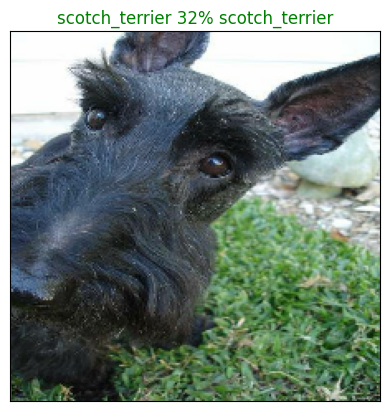

In [54]:
plot_pred(prediction_proba=predictions, label=val_labels_, image=val_images_)

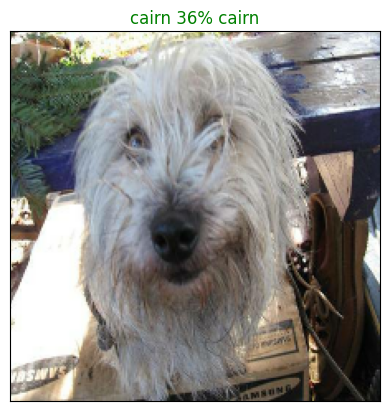

In [55]:
plot_pred(prediction_proba=predictions, label=val_labels_, image=val_images_, n=0)

In [56]:
def plot_pred_conf(prediction_proba, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_proba[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

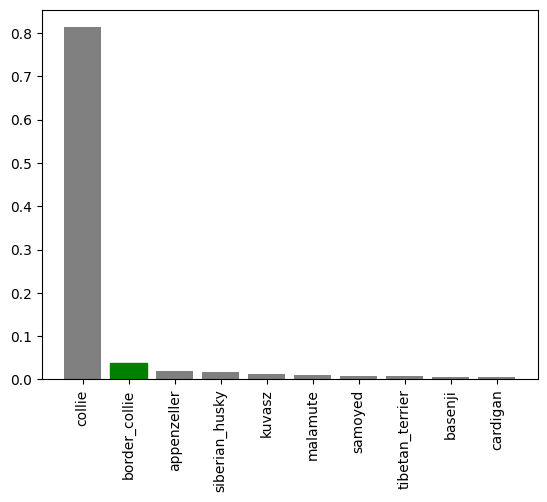

In [57]:
plot_pred_conf(prediction_proba=predictions,
               labels=val_labels_,
               n=9)

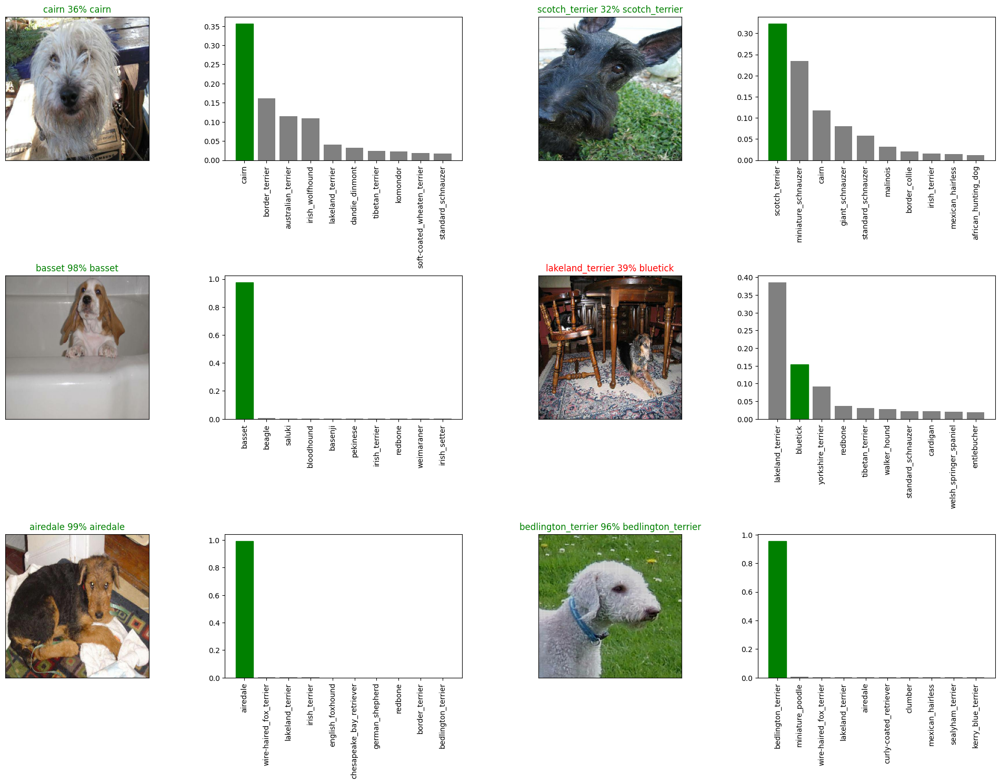

In [58]:
# Evaluate a few predictions
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(prediction_proba=predictions,
            label=val_labels_,
            image=val_images_,
            n=i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_proba=predictions,
                 labels=val_labels_,
                 n=i + i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Saving and loading the model

In [59]:
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and appends a suffix.
  """
  # Create model directory pathname with current time
  model_dir = os.path.join('drive/My Drive/Dog Vision/models',
                           datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = model_dir + '-' + suffix + '.keras'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [60]:
def load_model(model_path):
  """
  Loads a saved model from path.
  """
  print(f'Loading saved model from: {model_path}.')
  tf.keras.config.enable_unsafe_deserialization()
  model = tf.keras.models.load_model(model_path) #, custom_objects={'KerasLayer': hub.KerasLayer})
  return model

In [61]:
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/My Drive/Dog Vision/models/20240901-092548-1000-images-mobilenetv2-Adam.keras...


'drive/My Drive/Dog Vision/models/20240901-092548-1000-images-mobilenetv2-Adam.keras'

In [62]:
# loaded_1000_model = load_model('drive/My Drive/Dog Vision/models/20240831-121611-1000-images-mobilenetv2-Adam.keras')

## Training on full data

In [63]:
full_data = create_batches(X, y)

Creating training data batches...


In [64]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [65]:
full_model = create_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [66]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [67]:
# Fit the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 61s 167ms/step - accuracy: 0.4829 - loss: 2.3740
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 148ms/step - accuracy: 0.8875 - loss: 0.3874
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 147ms/step - accuracy: 0.9395 - loss: 0.2271
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - accuracy: 0.9705 - loss: 0.1406
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 149ms/step - accuracy: 0.9851 - loss: 0.0951
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 150ms/step - accuracy: 0.9876 - loss: 0.0741
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - accuracy: 0.9935 - loss: 0.0540
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 148ms/step - accuracy: 0.9959 - loss: 0.0424
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - accuracy: 0.9974 - loss: 0.0337
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 148ms/step - accuracy: 0.9978 - loss: 0.0276
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - accuracy: 0.9977 - loss: 0.0257
Epoch 12

In [68]:
save_model(full_model, suffix='full_image_set_mobilenetv2_Adam')

Saving model to: drive/My Drive/Dog Vision/models/20240901-095552-full_image_set_mobilenetv2_Adam.keras...


'drive/My Drive/Dog Vision/models/20240901-095552-full_image_set_mobilenetv2_Adam.keras'

## Making predictions on Test

In [70]:
test_path = 'drive/My Drive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e3dd8fc9162f726122ca4cc783114c81.jpg',
 'drive/My Drive/Dog Vision/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 'drive/My Drive/Dog Vision/test/dd3c80cee38d165aaf48083f4a4a0071.jpg',
 'drive/My Drive/Dog Vision/test/df86ba50c4d0b597af0d23bda37eb10e.jpg',
 'drive/My Drive/Dog Vision/test/e79030be9c9769f3604474aea16039bd.jpg',
 'drive/My Drive/Dog Vision/test/e3ff13afe2400a95e3ab76759d94fbc4.jpg',
 'drive/My Drive/Dog Vision/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 'drive/My Drive/Dog Vision/test/e647098485898391b700270c61824282.jpg',
 'drive/My Drive/Dog Vision/test/df92d68c07ec91b2f67cec77980e00cf.jpg',
 'drive/My Drive/Dog Vision/test/e6b2cfafb8c0a06c062832369365fa9e.jpg']

In [71]:
len(test_filenames)

10357

In [72]:
test_data = create_batches(test_filenames, test_data=True)

Creating test data batches...


In [73]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = full_model.predict(test_data, verbose=1)

251/324 ━━━━━━━━━━━━━━━━━━━━ 6:25 5s/step

In [ ]:
np.savetxt('drive/My Drive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

## Preparing for submission to Kaggle

In [ ]:
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
os.path.splitext(test_filnames[0])

In [ ]:
prefs_df['id'] = test_ids
prefs_df.head()

In [ ]:
prefs_df[list(unique_breeds)] = test_predictions
prefs_df.head()

In [ ]:
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv',
                index=False)